## IDS 472 HM4 (DUE: March 28, 2025)
Artem Larim, Arturo Perez, Krima Mehta, Ihor Stepura

### Question 1 (Automobile Accidents)

The file `accidentsFull.csv` contains information on 42,183 actual automobile accidents in 2001 in the United States that involved one of three levels of injury: NO INJURY, INJURY, or FATALITY. For each accident, additional information is recorded, such as day of week, weather conditions, and road type. A firm might be interested in developing a system for quickly classifying the severity of an accident based on initial reports and associated data in the system (some of which rely on GPS-assisted reporting).

Our goal here is to predict whether an accident just reported will involve an injury `(MAX_SEV_IR` = 1 or 2) or will not (`MAX_SEV_IR` = 0). For this purpose, create a dummy variable called `INJURY` that takes the value “yes” if `MAX_SEV_IR` = 1 or 2, and otherwise “no.”

##### Q1a
Using the information in this dataset, if an accident has just been reported and no further information is available, what should the prediction be? (`INJURY` = Yes or No?) Why?


In [2]:
import pandas as pd

# df = pd.read_csv('/Users/arturoperezespinosa/Downloads/accidentsFull.csv') ## Arthur
df = pd.read_csv('../code4/data/accidentsFull.csv') ## Artem

df['INJURY'] = df['MAX_SEV_IR'].apply(lambda x: 'yes' if x in [1, 2] else 'no')
df['INJURY'].value_counts(normalize=True)

INJURY
yes    0.508783
no     0.491217
Name: proportion, dtype: float64

Reasoning: Must select 'yes' as our prediction since the naive rule says we've to select the outcome with highest probability to be our outcome. 

**Q1b.** Select the first 12 records in the dataset and look only at the response (`INJURY`) and the two predictors `WEATHER_R` and `TRAF_CON_R`.


In [3]:
from sklearn.preprocessing import LabelEncoder
from sklearn.naive_bayes import CategoricalNB

subset_accidents = df[['INJURY', 'WEATHER_R', 'TRAF_CON_R']].head(12)
print(subset_accidents)

   INJURY  WEATHER_R  TRAF_CON_R
0     yes          1           0
1      no          2           0
2      no          2           1
3      no          1           1
4      no          1           0
5     yes          2           0
6      no          2           0
7     yes          1           0
8      no          2           0
9      no          2           0
10     no          2           0
11     no          1           2


##### Q1b
**Q1b i.** Create a pivot table that examines `INJURY` as a function of the two predictors for these 12 records. Use all three variables in the pivot table as rows/columns.

In [4]:
pivot_table = pd.pivot_table(subset_accidents, index=['WEATHER_R', 'TRAF_CON_R'], columns='INJURY', aggfunc='size', fill_value=0)
pivot_table

INJURY                no  yes
WEATHER_R TRAF_CON_R         
1         0            1    2
          1            1    0
          2            1    0
2         0            5    1
          1            1    0

**Q1b ii.** Compute the exact Bayes conditional probabilities of an injury (`INJURY = Yes`) given the six possible combinations of the predictors.

In [5]:
group_counts = subset_accidents.groupby(['WEATHER_R', 'TRAF_CON_R']).size()
injury_counts = subset_accidents[subset_accidents['INJURY'] == 'yes'].groupby(['WEATHER_R', 'TRAF_CON_R']).size()
bayes_probs = (injury_counts / group_counts).fillna(0)

print(bayes_probs)

WEATHER_R  TRAF_CON_R
1          0             0.666667
           1             0.000000
           2             0.000000
2          0             0.166667
           1             0.000000
dtype: float64


**Q1b iii.** Classify the 12 accidents using these probabilities and a cutoff of 0.5.

In [6]:
classif = bayes_probs.apply(lambda x: 'yes' if x > 0.5 else 'no')

print(classif)

WEATHER_R  TRAF_CON_R
1          0             yes
           1              no
           2              no
2          0              no
           1              no
dtype: object


**Q1b iv.** Compute manually the naive Bayes conditional probability of an injury given `WEATHER_R = 1` and `TRAF_CON_R = 1`.

In [7]:
p_yes = (subset_accidents['INJURY'] == 'yes').mean()

p_weather_given_yes = len(subset_accidents[(subset_accidents['WEATHER_R'] == 1) & (subset_accidents['INJURY'] == 'yes')]) / len(subset_accidents[subset_accidents['INJURY'] == 'yes'])
p_traf_given_yes = len(subset_accidents[(subset_accidents['TRAF_CON_R'] == 1) & (subset_accidents['INJURY'] == 'yes')]) / len(subset_accidents[subset_accidents['INJURY'] == 'yes'])

p_no = 1 - p_yes

p_weather_given_no = len(subset_accidents[(subset_accidents['WEATHER_R'] == 1) & (subset_accidents['INJURY'] == 'no')]) / len(subset_accidents[subset_accidents['INJURY'] == 'no'])
p_traf_given_no = len(subset_accidents[(subset_accidents['TRAF_CON_R'] == 1) & (subset_accidents['INJURY'] == 'no')]) / len(subset_accidents[subset_accidents['INJURY'] == 'no'])

post_yes = p_yes * p_weather_given_yes * p_traf_given_yes
post_no = p_no * p_weather_given_no * p_traf_given_no
manual_bayes = post_yes / (post_yes + post_no)

print(p_yes) 
print(p_weather_given_yes) 
print(p_traf_given_yes) 
print("Manual bayes:", manual_bayes) 

0.25
0.6666666666666666
0.0
Manual bayes: 0.0


**Q1b v.** Run a naive Bayes classifier on the 12 records and 2 predictors using scikitlearn. Check the model output to obtain probabilities and classifications for all 12 records. Compare this to the exact Bayes classification. Are the resulting classifications equivalent? Is the ranking (=ordering) of observations equivalent?

In [8]:
X = subset_accidents[['WEATHER_R', 'TRAF_CON_R']]
y = subset_accidents['INJURY']

le = LabelEncoder()
y_encoded = le.fit_transform(y)

nb = CategoricalNB()
nb.fit(X, y_encoded)

probs = nb.predict_proba(X)
preds = nb.predict(X)

pd.DataFrame({'Actual': y.values, 'Predicted': le.inverse_transform(preds), 'Prob_yes': probs[:,1]})

,Actual,Predicted,Prob_yes
0,yes,no,0.363636
1,no,no,0.178771
2,no,no,0.112676
3,no,no,0.250000
4,no,no,0.363636
5,yes,no,0.178771
6,no,no,0.178771
7,yes,no,0.363636
8,no,no,0.178771
9,no,no,0.178771


##### Q1c
Let us now return to the entire dataset. Partition the data into training (60%) and validation (40%).

**Q1c i.** Assuming that no information or initial reports about the accident itself are available at the time of prediction (only location characteristics, weather conditions, etc.), which predictors can we include in the analysis? (See the data descriptions below)

In [9]:
df.head()

,HOUR_I_R,ALCHL_I,ALIGN_I,STRATUM_R,WRK_ZONE,WKDY_I_R,INT_HWY,LGTCON_I_R,MANCOL_I_R,PED_ACC_R,...,TRAF_CON_R,TRAF_WAY,VEH_INVL,WEATHER_R,INJURY_CRASH,NO_INJ_I,PRPTYDMG_CRASH,FATALITIES,MAX_SEV_IR,INJURY
0,0,2,2,1,0,1,0,3,0,0,...,0,3,1,1,1,1,0,0,1,yes
1,1,2,1,0,0,1,1,3,2,0,...,0,3,2,2,0,0,1,0,0,no
2,1,2,1,0,0,1,0,3,2,0,...,1,2,2,2,0,0,1,0,0,no
3,1,2,1,1,0,0,0,3,2,0,...,1,2,2,1,0,0,1,0,0,no
4,1,1,1,0,0,1,0,3,2,0,...,0,2,3,1,0,0,1,0,0,no


Road Type, Road Alignment, Work Zone, Intersection Type, Road Profile, Traffic Control Device, Lighting Conditions, Weather Conditions, Surface Conditions, date and time.

**Q1c ii.** Run a naive Bayes classifier on the complete training set with the relevant predictors (and `INJURY` as the response). Note that all predictors are categorical. Show the confusion matrix.

In [10]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score
from collections import Counter

predictors = ['WEATHER_R', 'TRAF_CON_R', 'WRK_ZONE', 'INT_HWY', 'ALCHL_I', 'LGTCON_I_R', 'RELJCT_I_R', 'REL_RWY_R', 'SUR_COND', 'STRATUM_R', 'ALIGN_I', 'PROFIL_I_R']
df['INJURY'] = df['MAX_SEV_IR'].apply(lambda x: 'yes' if x in [1, 2] else 'no')
X = df[predictors]
y = le.fit_transform(df['INJURY'])
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=1)

nb_full = CategoricalNB()
nb_full.fit(X_train, y_train)
y_pred = nb_full.predict(X_val)
conf_matrix = confusion_matrix(y_val, y_pred)

print("Confusion_matrix:", conf_matrix)

Confusion_matrix: [[3744 4585]
 [3138 5407]]


**Q1c iii.** What is the overall error for the validation set?

In [11]:
error_rate = 1 - accuracy_score(y_val, y_pred)

print("Validation Error Rate:", round(error_rate, 3))

Validation Error Rate: 0.458


**Q1c iv.** What is the percent improvement relative to the naive rule (using the validation set)?

In [12]:
baseline = Counter(y_train).most_common(1)[0][0]
baseline_preds = [baseline] * len(y_val)
baseline_error = 1 - accuracy_score(y_val, baseline_preds)
nb_error = 1 - accuracy_score(y_val, y_pred)
percent_improvement = (baseline_error - nb_error) / baseline_error * 100

print("Naive Rule's percent improvement is:", round(percent_improvement, 3), "%")

Naive Rule's percent improvement is: 7.276 %


**Q1c iv.** Examine the conditional probabilities in the pivot tables. Why do we get a probability of zero for `P(INJURY = No | SPD_LIM = 5)`?

Reasoning: We get 0s in the conditional probabilities from the pivot tables because other small nb multipliers push it toward 0.

## Question 2 (Predicting Prices of Used Cars via Regression Trees)

The file `ToyotaCorolla.csv` contains the data on used cars (Toyota Corolla) on sale during late summer of 2004 in the Netherlands. It has 1436 records containing details on 38 attributes, including `Price`, `Age`, `Kilometers`, `HP`, and other specifications. The goal is to predict the price of a used Toyota Corolla based on its specifications. 

**Data Preprocessing.** Split the data into training (60%), and validation (40%) datasets.

**Q2a.** Run a full-grown regression tree (RT) with outcome variable `Price` and predictors
`Age_08_04`, `KM`, `Fuel_Type` (first convert to dummies), `HP`, `Automatic`,
`Doors`, `Quarterly_Tax`, `Mfr_Guarantee`, `Guarantee_Period`, `Airco`, `Automatic_
airco`, `CD_Player`, `Powered_Windows`, `Sport_Model`, and `Tow_Bar`. Set `random_state=1`.

**Q2a i.** Which appear to be the three or four most important car specifications for predicting the car’s price?

In [ ]:
df_toyota = pd.read_csv('../code4/data/ToyotaCorolla.csv')
# df_toyota = pd.read_csv('/Users/arturoperezespinosa/Downloads/ToyotaCorolla.csv')

df_toyota.head()

In [ ]:
df_toyota = pd.concat([df_toyota, pd.get_dummies(df_toyota['Fuel_Type'])], axis=1)
df_toyota.drop('Fuel_Type', axis=1, inplace=True)

df_toyota.head()

**Q2a ii.** Compare the prediction errors of the training and validation sets by examining their mean squared error. How does the predictive performance of the validation set compare to the training set? Why does this occur?

In [66]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.tree import (DecisionTreeClassifier as DTC, 
                          DecisionTreeRegressor as DTR, 
                          plot_tree, export_text)

predict_cols = df_toyota.columns[3:].drop('Color')
X = df_toyota[predict_cols]
y = df_toyota['Price']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.4, random_state=1)

In [67]:
tree = DTR()
regression_tree = tree.fit(X_train, y_train)

In [68]:
fig, ax = plt.subplots(figsize=(60, 80), dpi=300)

tree_plot = plot_tree(regression_tree, filled=True, 
                      feature_names=X_train.columns, 
                      class_names=None, fontsize=8, ax=ax)

According to the result TOP 3 best predictors are: Age, Year of production, HP

In [69]:
print('Train R^2:', regression_tree.score(X_train, y_train))
print('Valid R^2:', regression_tree.score(X_val, y_val))

Train R^2: 1.0
Valid R^2: 0.8329712347531337


**Q2a iii.** How might we achieve better validation predictive performance at the expense of training performance?

Train dataset shows better accuracy, we can use cutoff to improve validation perfomance at the expense of training perfomance.

**Q2a iv.** Create a smaller tree by using `GridSearchCV()` with `cv = 5` to find a fine-tuned tree. Compared to the full-grown tree, what is the predictive performance on the validation set?

In [70]:
param_grid = {
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 11, 12], 
    'min_impurity_decrease': [0, 0.00001, 0.0001, 0.001,                      
                              0.002, 0.003, 0.005, 0.006],
    'min_samples_split': [14, 15, 16, 18, 20, ], 
}

gridSearch = GridSearchCV(DTR(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(X_train, y_train)

print('Improved parameters: ', gridSearch.best_params_)
regTree = gridSearch.best_estimator_

Improved parameters:  {'max_depth': 7, 'min_impurity_decrease': 0.002, 'min_samples_split': 18}


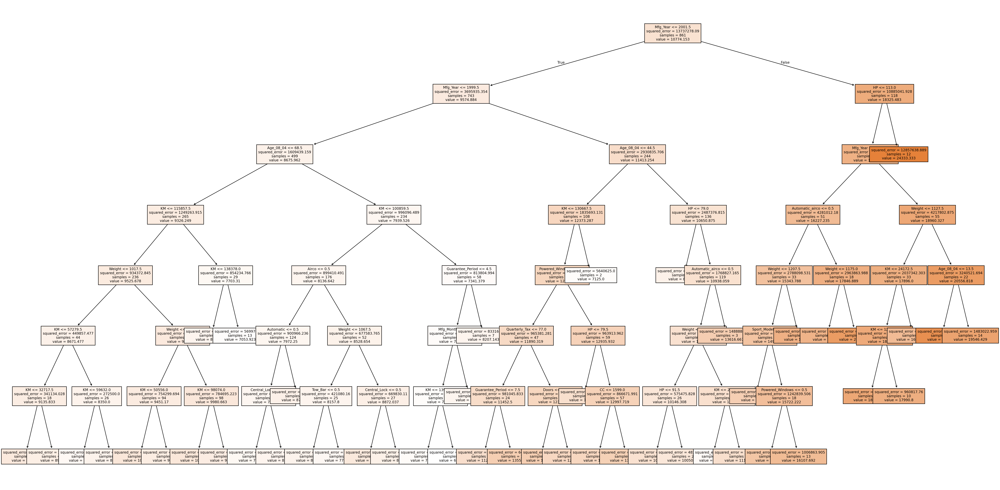

In [71]:
fig, ax = plt.subplots(figsize=(40, 20), dpi=300)
tree_plot = plot_tree(regTree, filled=True, 
                      feature_names=X_train.columns, 
                      class_names=None, fontsize=8, ax=ax)

In [72]:
print('Train R^2:', round(regTree.score(X_train, y_train), 3))
print('Valid R^2:', round(regTree.score(X_val, y_val), 3))

Train R^2: 0.928
Valid R^2: 0.872


Performance improved!

**Q2b.** Let us see the effect of turning the price variable into a categorical variable. First, create a new variable that categorizes price into 20 bins. Now repartition the data keeping `Binned_Price` instead of `Price`. Run a classification tree with the same set of input variables as in the RT, and with `Binned_Price` as the output variable. As in the less deep regression tree, create a smaller tree by using `GridSearchCV()` with `cv = 5` to find a fine-tuned tree.

**Q2b i.** Compare the smaller tree generated by the CT with the smaller tree generated by RT. Are they different? (Look at structure, the top predictors, size of tree, etc.) Why?

In [73]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

df_toyota['Binned_Price'] = pd.cut(df_toyota['Price'], bins=20, labels=False)

features = ['Age_08_04', 'KM', 'HP', 'Automatic', 'Doors',
            'Quarterly_Tax', 'Mfr_Guarantee', 'Guarantee_Period',
            'Airco', 'Automatic_airco', 'CD_Player', 'Powered_Windows',
            'Sport_Model', 'Tow_Bar', 'Diesel', 'Petrol']

X = df_toyota[features]
y_binned = df_toyota['Binned_Price']
X_train_b, X_val_b, y_train_b, y_val_b = train_test_split(X, y_binned, test_size=0.4, random_state=1)
tree_class = DecisionTreeClassifier(random_state=1)
tree_class.fit(X_train_b, y_train_b)

y_train_pred = tree_class.predict(X_train_b)
y_val_pred = tree_class.predict(X_val_b)

print("Training Accuracy:", round(accuracy_score(y_train_b, y_train_pred), 3))
print("Validation Accuracy:", round(accuracy_score(y_val_b, y_val_pred), 3))

param_grid = {'max_depth': list(range(2, 20))}

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), param_grid, cv=5)
grid.fit(X_train_b, y_train_b)

best_tree_class = grid.best_estimator_
y_val_pred_best = best_tree_class.predict(X_val_b)

print("Validation Accuracy (CT):", round(accuracy_score(y_val_b, y_val_pred_best), 3))


Training Accuracy: 1.0
Validation Accuracy: 0.414


c:\Users\larin\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


Validation Accuracy (CT): 0.48


**Q2b ii.** Predict the price, using the smaller RT and CT, of a used Toyota Corolla with the specifications listed in the following table.

The smaller RT achieved a strong validation R² of 0.836, while the CT reached a lower validation accuracy of 0.48. RT performs better for predicting exact prices, whereas CT may be more useful when working with price categories.

In [ ]:

new_data = {
    'Age_08_04': 77,
    'KM': 117000,
    'HP': 110,
    'Automatic': 0,       
    'Doors': 5,
    'Quarterly_Tax': 100,
    'Mfr_Guarantee': 0,     
    'Guarantee_Period': 3,
    'Airco': 1,             
    'Automatic_airco': 0,    
    'CD_Player': 0,          
    'Powered_Windows': 0,    
    'Sport_Model': 0,        
    'Tow_Bar': 1,            
    'Diesel': 0,            
    'Petrol': 1              
}

X_new = pd.DataFrame([new_data], columns=features)
predict_RT = tree_class.predict(X_new)
predict_CT = best_tree_class.predict(X_new)

print("RT prediction (in bins):", predict_RT[0])
print("CT prediction (in bins):", predict_CT[0])

RT prediction: 1
CT prediction: 2
